## Laboratorium 8.2


## Przepływ optyczny i śledzenie obiektów

### Wprowadzenie

Metodę przepływu optycznego (między innymi) można stosować również do śledzenia obiektów. Zazwyczaj wykorzystuje się w tym celu metody rzadkie połączone ze znanymi już nam metodami detekcji punktów zainteresowania. Procedura przebiega podobnie jak w przypadku gęstego przepływu (tzn. operujemy na parze klatek w skali szarości, znajdujemy wektory przesunięć), z tą różnicą że obliczanie przepływu zachodzi wyłącznie dla interesujących nas punktów - a zatem musimy znać ich położenia, aby zainicjować proces. Można sobie wyobrazić różne sposoby zlokalizowania punktów kluczowych, w zależności od konkretnego zastosowania i założeń: być może np. pipeline do przetwarzania rozpoczyna się od zlokalizowania jakichś obiektów, być może z góry wiemy, gdzie obiekty się znajdują.

W OpenCV podstawową metodą do obliczania przepływu dla zbioru punktów jest metoda Lucasa-Kanade, zaimplementowana w funkcji [`cv2.calcOpticalFlowPyrLK`](https://docs.opencv.org/3.4/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323). Podobnie jak w metodzie Farnebacka, argument `nextPts` ustawiamy na `None` (chyba, że chcemy zainicjować rozwiązanie już znanymi położeniami punktów, ale w praktyce z reguły nie będziemy mieli takiej wygody), argumenty `status` i `err` pomijamy zupełnie. W odróżnieniu od Farnebacka, wynikiem są absolutne położenia punktów na drugiej klatce (a nie wektory przesunięć). Dodatkowo otrzymujemy też wektor `status` informujący dla każdego punktu, czy udało się go odnaleźć, oraz `err` mierzący jakąś miarę błędu wizualnego pomiędzy fragmentem obrazu zawierającym dany punkt kluczowy.

Do inicjalizacji rozwiązania można wykorzystać znane nam metody znajdowania punktów kluczowych, albo opartą o detektor Harrisa funkcję [`cv2.goodFeaturesToTrack`](https://docs.opencv.org/3.4/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541) - jest nieco prostsza w użyciu, bo na wyjściu otrzymujemy po prostu macierz `np.float32` o wymiarach $Nx1x2$ zawierającą koordynaty znalezionych punktów.

Oczywiście, śledzenie obiektów oparte o jednorazową inicjalizację jest narażone na błędy: zniknięcie lub tymczasowe zasłonięcie śledzonego obiektu, czy choćby zmiana jego wyglądu (np. wskutek pojawienia się cienia) mogą spowodować, że przepływ nie zostanie obliczony. Może być też pożądana możliwość śledzenia ciągłego z uwzględnieniem pojawiania się nowych obiektów (np. monitorowanie CCTV). W takich sytuacjach konieczne jest regularne odświeżanie inicjalizacji, tj. ponowne wykrycie interesujących obiektów. To z kolei prowadzi do kolejnego problemu: jeżeli interesuje nas cała historia ruchu danych obiektów, przy czym do pewnego momentu ich lokalizacje uzyskiwaliśmy za pomocą przepływu optycznego, a w pewnym momencie wykonaliśmy ponowną detekcję - to jak powiązać jedno z drugim, by zapewnić ciągłość lokalizacji? To zagadnienie, oraz pozostałe tematy dyskutowane w tym kontekście na wykładzie, nie będzie jednak centralne na laboratorium.

---

### Cel zadania

Celem tej listy jest (1) zapoznanie się z metodą przepływu optycznego rzadkiego do zastosowań śledzenia obiektów, oraz (2) zastosowanie tej techniki w praktyce, na przykładzie monitorowania prędkości obiektu (w metrach na sekundę). Przykładem badawczym będzie nagranie startu Wahadłowca Kosmicznego _Discovery_ (misja [STS-124](https://en.wikipedia.org/wiki/STS-124)), zarejestrowane jedną z kamer technicznych (plik `shuttle.mp4`).

Aby obliczyć prędkość, potrzebna jest znajomość drogi (w metrach) i czasu (w sekundach). Czas między klatkami obliczysz, znając liczbę klatek na sekundę, którą możesz pobrać bezpośrednio z otwartego obiektu `VideoCapture` za pomocą następującej konstrukcji:  
```python
fps = source.get(cv2.CAP_PROP_FPS)
```  
Wyznaczenie przelicznika między przestrzenią obrazu (w pikselach) a przestrzenią świata (w metrach) jest w ogólności [nieco złożonym zagadnieniem](https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html); znalezienie uproszczonej alternatywy jest Twoim zadaniem.

Źródło nagrania: [_"Best of the Best" Provides New Views, Commentary of Shuttle Launches_ (NASA @ YouTube)](https://www.youtube.com/watch?v=vFwqZ4qAUkE), 29:06.5  
Nagranie o oryginalnej prędkości ~225 fps (spowolnienie ok. 1:7.5) zostało przekodowane tak, aby osiągnąć zbieżność upływu czasu. Możesz się o tym upewnić patrząc na _timestamp_ z prawej strony nagrania ([_jak go czytać_](https://space.stackexchange.com/a/38569)).

In [50]:
import random

import numpy as np
from pprint import pprint
import cv2
from utils import *
import matplotlib.pyplot as plt

### Zadanie 1

Na podstawie pierwszej klatki z materiału dokonaj kalibracji parametrów detektora cech do śledzenia (sugerowany detektor: [`cv2.goodFeaturesToTrack`](https://docs.opencv.org/3.4/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541)). Dobór tych parametrów jest kluczowy dla reszty zadania, więc zapoznaj się z ich znaczeniem.

fps: 29.97
points: float32 (100, 1, 2)


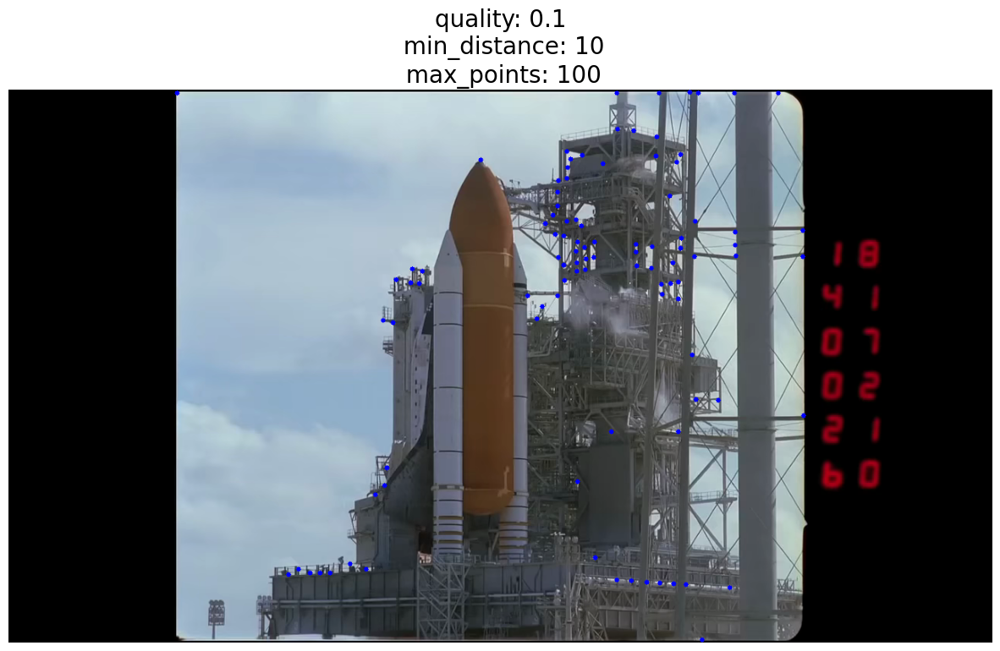

In [51]:
source = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
status, frame = source.read()
fps = source.get(cv2.CAP_PROP_FPS)
print('fps:', fps)
source.release()

quality = 0.1
min_distance = 10
max_points = 100

frame_copy = frame.copy()
points = cv2.goodFeaturesToTrack(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), max_points, quality, min_distance)
for point in points:
    x, y = point.ravel()
    x, y = int(x), int(y)
    cv2.circle(frame_copy, (x, y), 3, (255, 0, 0), -1)

print('points:', points.dtype, points.shape)
display_images([frame_copy], ['quality: 0.1\n min_distance: 10\n max_points: 100'], figsize=(15, 15))

points: float32 (65, 1, 2)


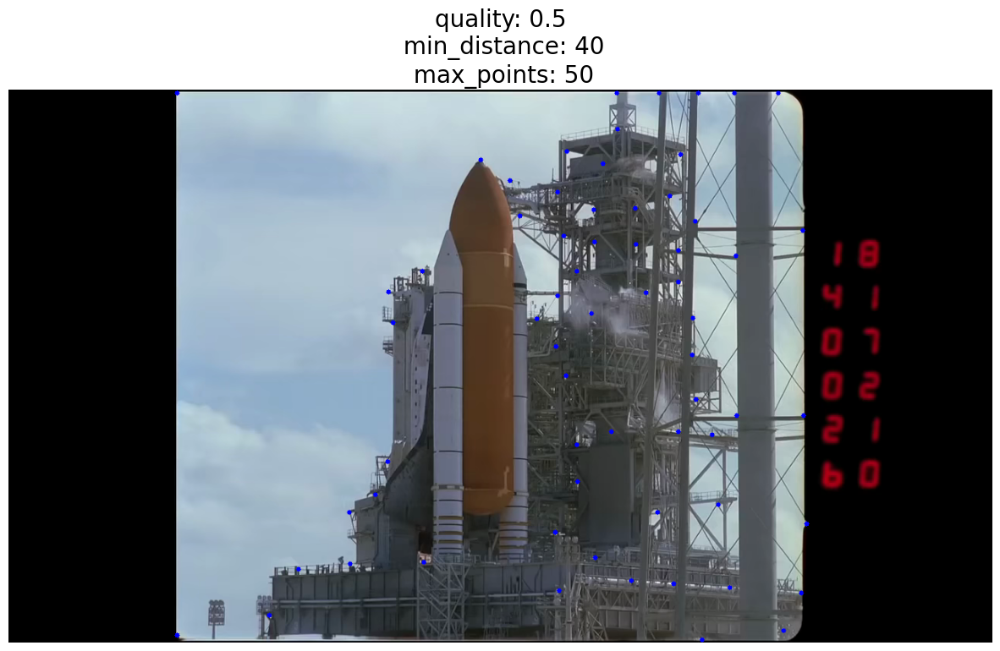

In [52]:
quality = 0.3
min_distance = 40
max_points = 100

frame_copy = frame.copy()
points = cv2.goodFeaturesToTrack(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), max_points, quality, min_distance)
for point in points:
    x, y = point.ravel()
    x, y = int(x), int(y)
    cv2.circle(frame_copy, (x, y), 3, (255, 0, 0), -1)

print('points:', points.dtype, points.shape)
display_images([frame_copy], ['quality: 0.5\n min_distance: 40\n max_points: 50'], figsize=(15, 15))

points: float32 (177, 1, 2)


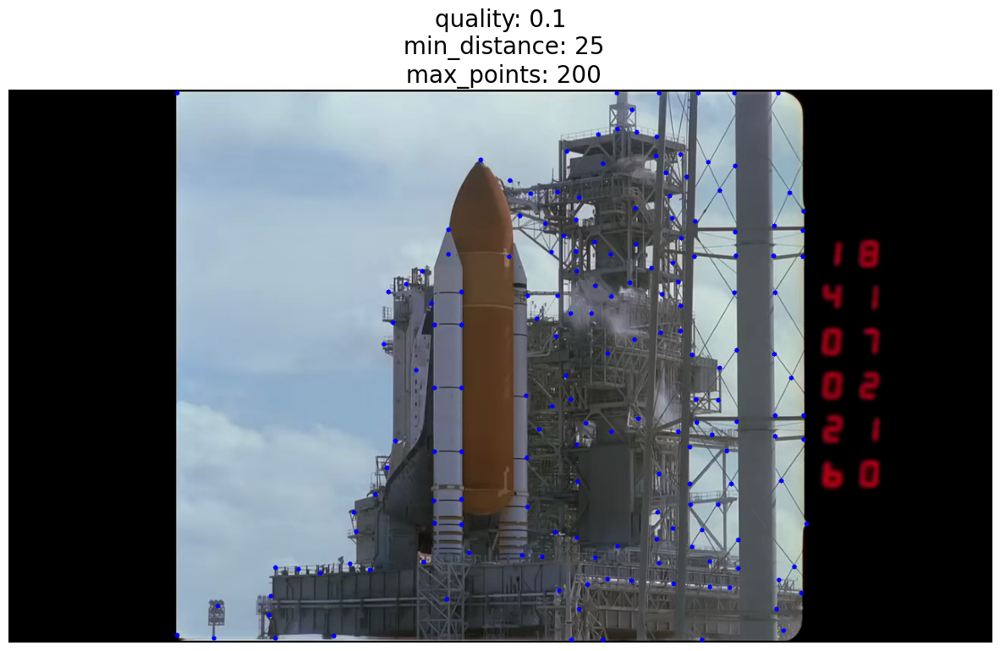

In [53]:
quality = 0.1
min_distance = 25
max_points = 200

frame_copy = frame.copy()
points = cv2.goodFeaturesToTrack(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), max_points, quality, min_distance)
for point in points:
    x, y = point.ravel()
    x, y = int(x), int(y)
    cv2.circle(frame_copy, (x, y), 3, (255, 0, 0), -1)

print('points:', points.dtype, points.shape)
display_images([frame_copy], [f'quality: {quality}\n min_distance: {min_distance}\n max_points: {max_points}'],
               figsize=(15, 15))

In [54]:
def create_maks(x, y, w, h, frame):
    mask = np.zeros_like(frame, dtype=np.uint8)
    mask[y:y + h, x:x + w] = 255
    return mask

<class 'numpy.ndarray'> uint8 (720, 1280, 3)


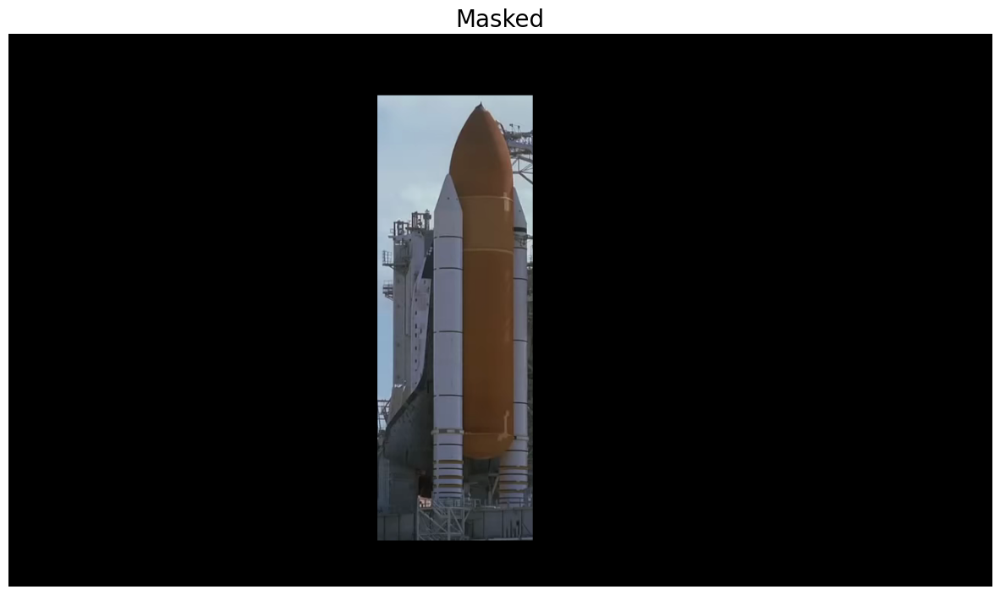

<class 'numpy.ndarray'> uint8 (720, 1280)


In [115]:
m1 = create_maks(480, 80, 202, 580, frame)
print(type(m1), m1.dtype, m1.shape)
f2 = frame.copy()
masked = cv2.bitwise_and(f2, m1)
display_images([masked], ['Masked'], figsize=(15, 15))
m1 = cv2.cvtColor(m1, cv2.COLOR_BGR2GRAY)
print(type(m1), m1.dtype, m1.shape)

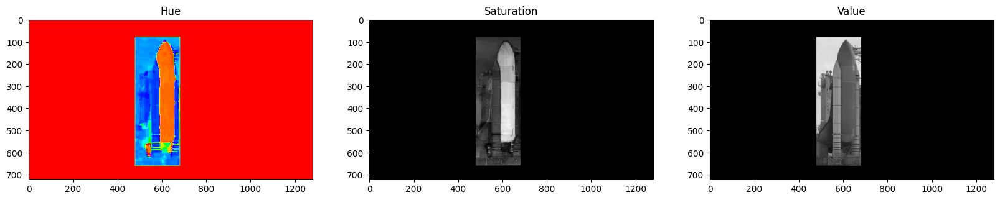

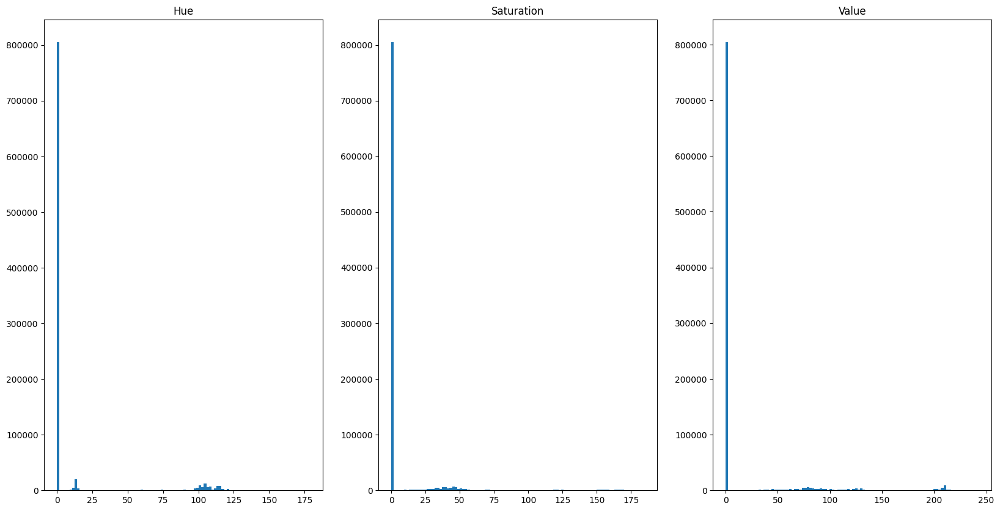

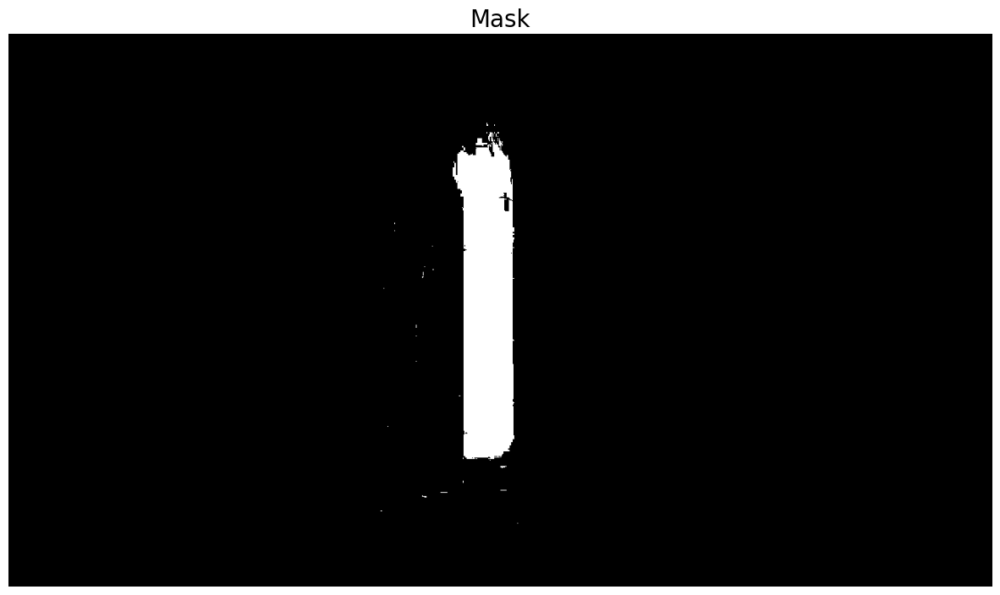

uint8 (720, 1280)


In [56]:
hsv_masked = cv2.cvtColor(masked, cv2.COLOR_BGR2HSV)
show_hsv(hsv_masked)
H, S, V = cv2.split(hsv_masked)
hist_hsv(hsv_masked)
# binaryzacja
thresh = 105
_, mask = cv2.threshold(S, thresh, 255, cv2.THRESH_BINARY)
display_images([mask], ['Mask'], figsize=(15, 15))
print(mask.dtype, mask.shape)

In [278]:
def make_mask(frame, m2=False):
    if m2:
        m1 = create_maks(580, 480, 80, 80, frame)
    else:
        m1 = create_maks(480, 80, 202, 580, frame)
    masked = cv2.bitwise_and(frame, m1)

    hsv = cv2.cvtColor(masked, cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv)
    _, mask = cv2.threshold(S, 115, 255, cv2.THRESH_BINARY)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.dilate(mask, kernel, iterations=3)

    return mask

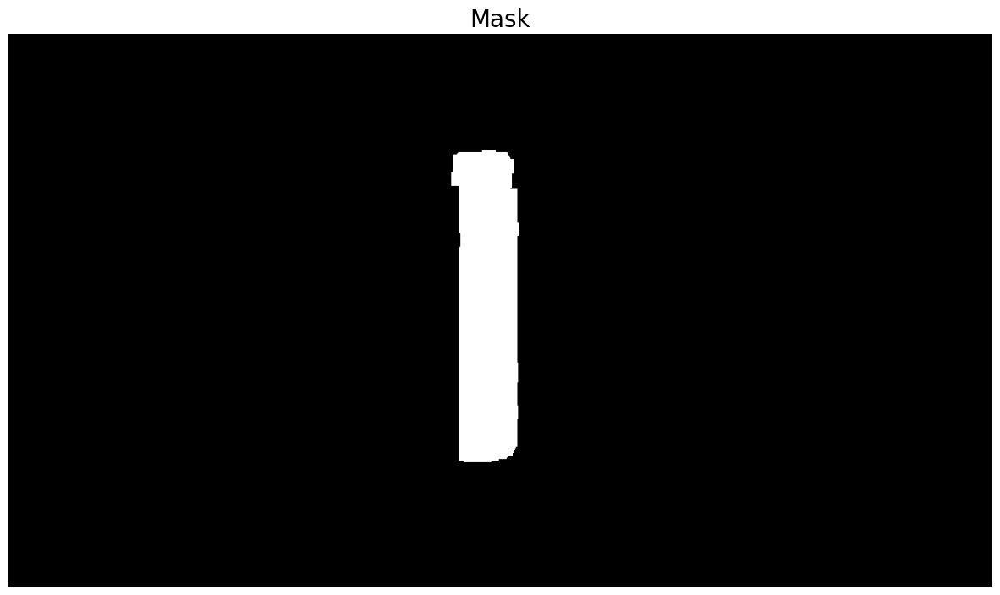

In [264]:
mask = make_mask(frame)
display_images([mask], ['Mask'], figsize=(15, 15))

points: float32 (42, 1, 2)


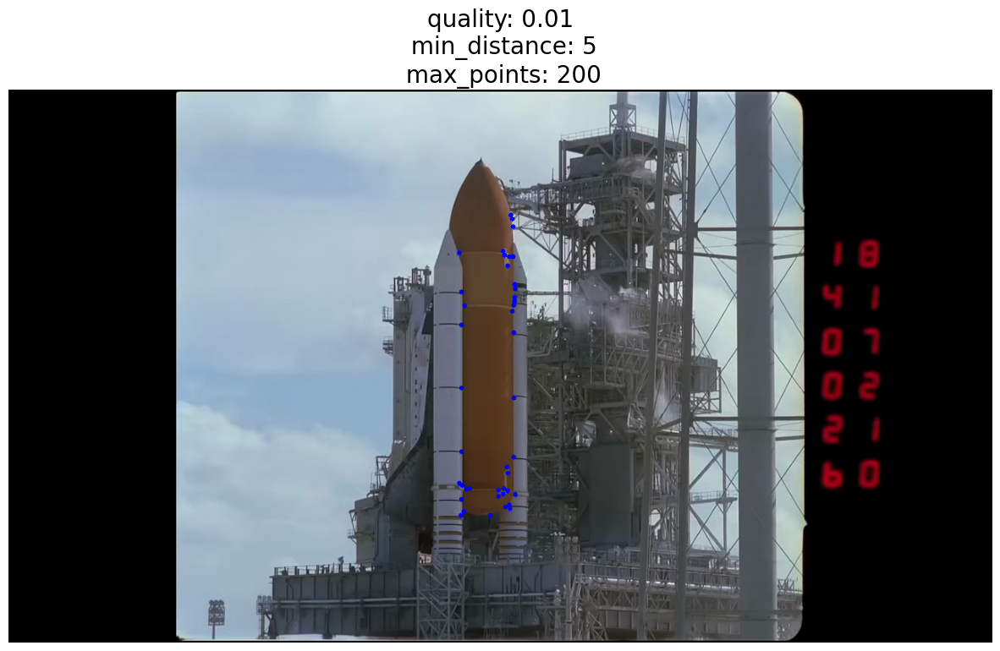

In [265]:
quality = 0.01
min_distance = 5
max_points = 200

frame_copy = frame.copy()
points = cv2.goodFeaturesToTrack(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), max_points, quality, min_distance, mask=mask)

for point in points:
    x, y = point.ravel()
    x, y = int(x), int(y)
    cv2.circle(frame_copy, (x, y), 3, (255, 0, 0), -1)

print('points:', points.dtype, points.shape)
display_images([frame_copy], [f'quality: {quality}\n min_distance: {min_distance}\n max_points: {max_points}'],
               figsize=(15, 15))

### Zadanie 2

Uzupełnij daną poniżej podstawową pętlę analizy wideo o śledzenie obiektów: inicjalizację i wykorzystanie przepływu optycznego do aktualizacji ich położenia. Celem jest pozyskanie pełnej trajektorii pojazdu, tak aby można było ją narysować (np. [`cv2.polylines`](https://docs.opencv.org/3.4/d6/d6e/group__imgproc__draw.html#gaa3c25f9fb764b6bef791bf034f6e26f5)) tudzież przetwarzać dalej.

Zapoznaj się dobrze z dokumentacją funkcji [`cv2.calcOpticalFlowPyrLK`](https://docs.opencv.org/3.4/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323), zwłaszcza z wartościami zwracanymi, **zwłaszcza** `status`. Upewnij się, że odpowiednio obsługujesz przypadki niepowodzenia znalezienia przepływu dla poszczególnych punktów.

Wynik zaprezentuj w postaci graficznej (narysowane trajektorie).

In [266]:
def baseLoop(source: cv2.VideoCapture, max_points, quality, min_distance, m2=False):
    frame1 = None
    read_status, frame2 = source.read()
    color_frame = frame2.copy()
    frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
    mask = make_mask(color_frame, m2)
    display_images([mask], ['Mask'], figsize=(15, 15))
    
    prev_points = cv2.goodFeaturesToTrack(frame2, max_points, quality, min_distance, mask=mask)
    
    for point in prev_points:
        x, y = point.ravel()
        x, y = int(x), int(y)
        cv2.circle(color_frame, (x, y), 3, (255, 0, 0), -1)
    display_images([color_frame], ['Frame'], figsize=(15, 15))
    
    blank = np.zeros_like(color_frame)
    blank_one = np.zeros_like(color_frame)
    
    color = np.random.randint(0, 255, (100, 3))
    onetraj = []  # trajectory of one point 
    point_id = 34
    frame_id = 1
    vel = {}
    
    while read_status:
        frame1 = frame2
        read_status, frame2 = source.read()
    
        if not read_status:
            break
    
        frame_color = frame2.copy()
        frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
        nextPts, status, err = cv2.calcOpticalFlowPyrLK(frame1, frame2, prev_points, None)
    
        good_new = nextPts[status == 1]
        good_old = prev_points[status == 1]
    
        # oblicz predkosc
        velocity = np.mean(np.linalg.norm(good_new - good_old, axis=1))
        vel[frame_id] = velocity
    
        frame_color_one = frame_color.copy()
    
        if len(good_new) < len(prev_points):
            break
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            a, b, c, d = int(a), int(b), int(c), int(d)
            blank = cv2.line(blank, (a, b), (c, d), color[i].tolist(), 2)
            frame_color = cv2.circle(frame_color, (a, b), 5, color[i].tolist(), -1)
            if i == point_id:
                onetraj.append((a, b))
                blank_one = cv2.line(blank_one, (a, b), (c, d), color[i].tolist(), 2)
                frame_color_one = cv2.circle(frame_color_one, (a, b), 5, color[i].tolist(), -1)
    
        img = cv2.add(frame_color, blank)
        prev_points = good_new.reshape(-1, 1, 2)
        img2 = cv2.add(frame_color_one, blank_one)
        frame_id += 1
    
    display_images([img], ['Frame'], figsize=(15, 15))
    # display_images([img2], ['Frame'], figsize=(15, 15))
    
    return vel, onetraj

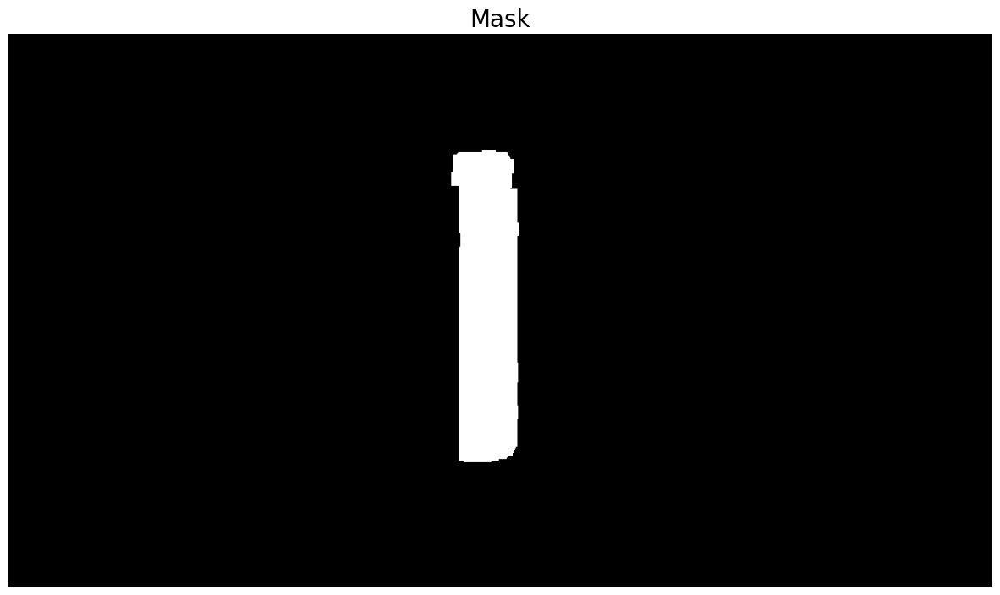

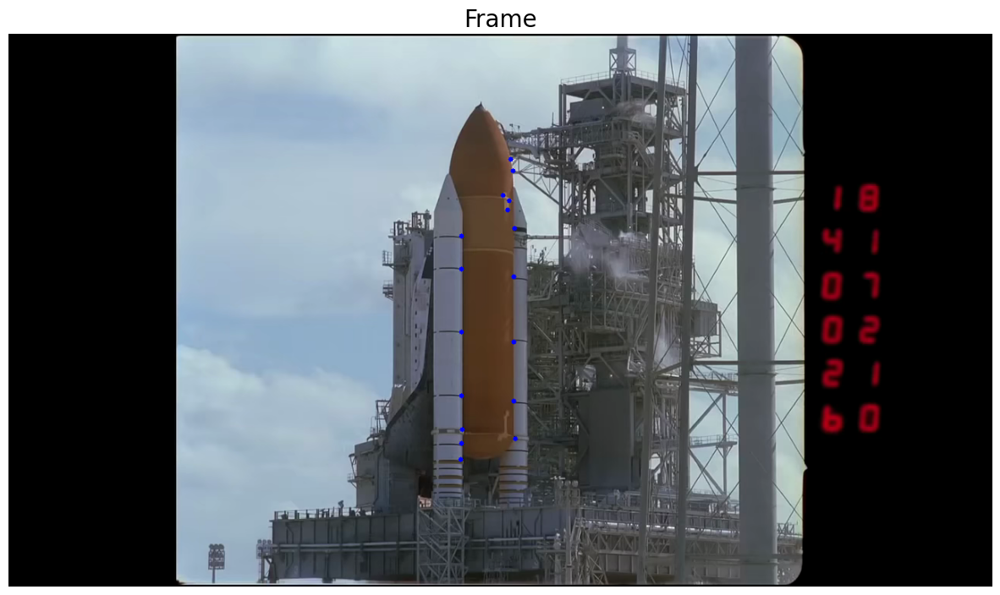

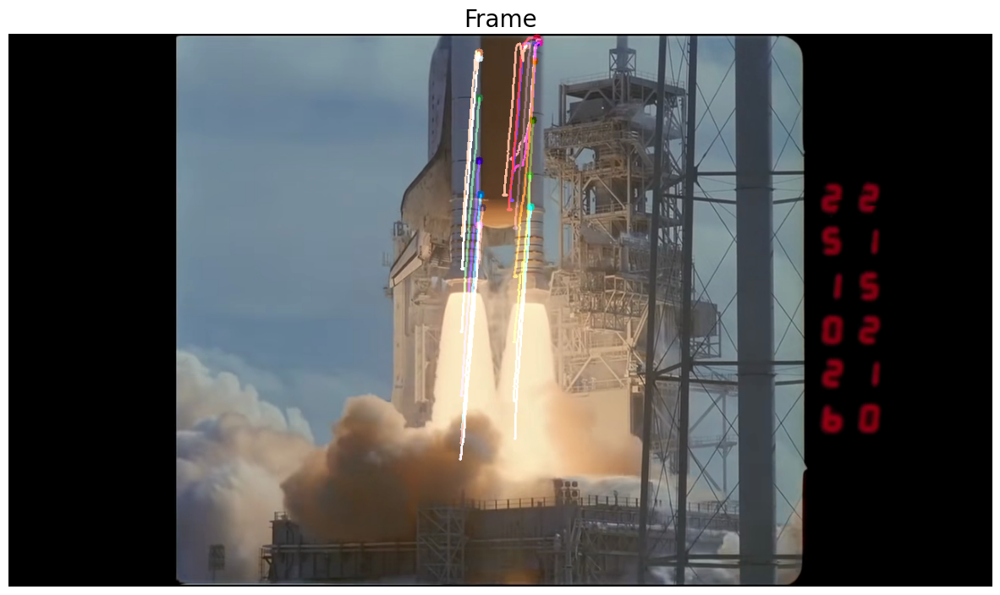

In [267]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj1 = baseLoop(shuttle, 100, 0.1, 10)

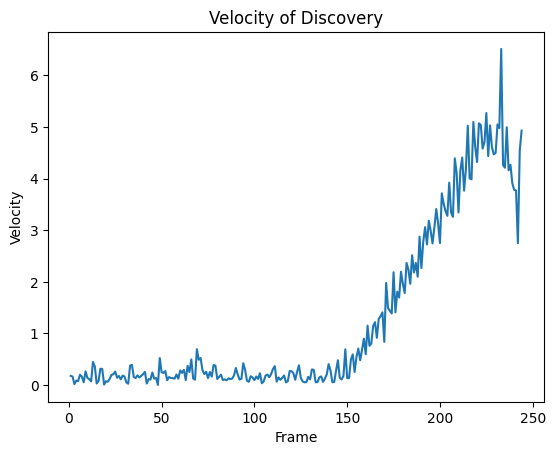

In [268]:
# plot velocities
plt.plot(list(velocities.keys()), list(velocities.values()))
plt.xlabel('Frame')
plt.ylabel('Velocity')
plt.title('Velocity of Discovery')
plt.show()

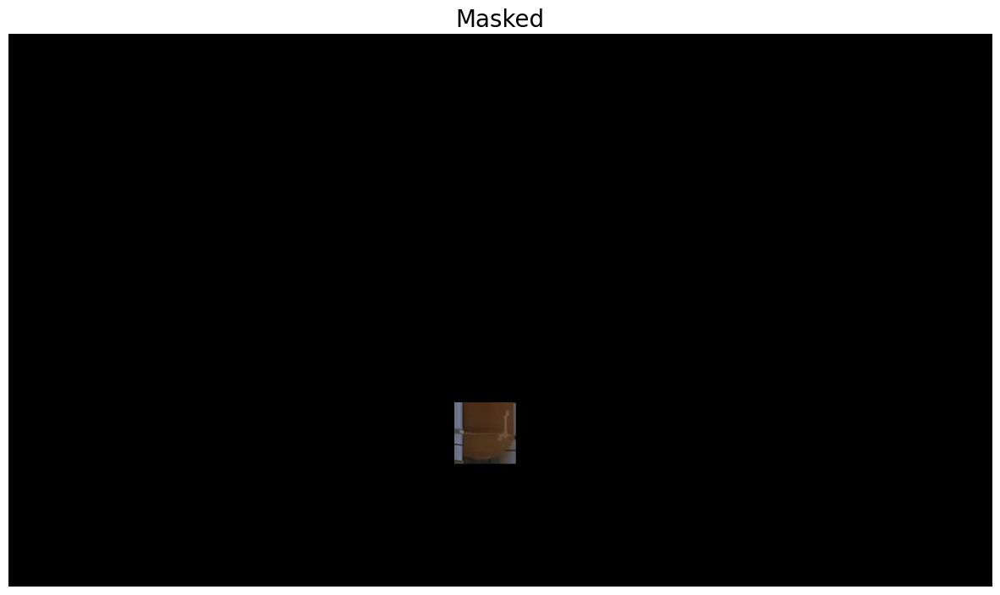

In [277]:
m2 = create_maks(580, 480, 80, 80, frame)
f3 = frame.copy()
masked2 = cv2.bitwise_and(f3, m2)
display_images([masked2], ['Masked'], figsize=(15, 15))
m2 = cv2.cvtColor(m2, cv2.COLOR_BGR2GRAY)

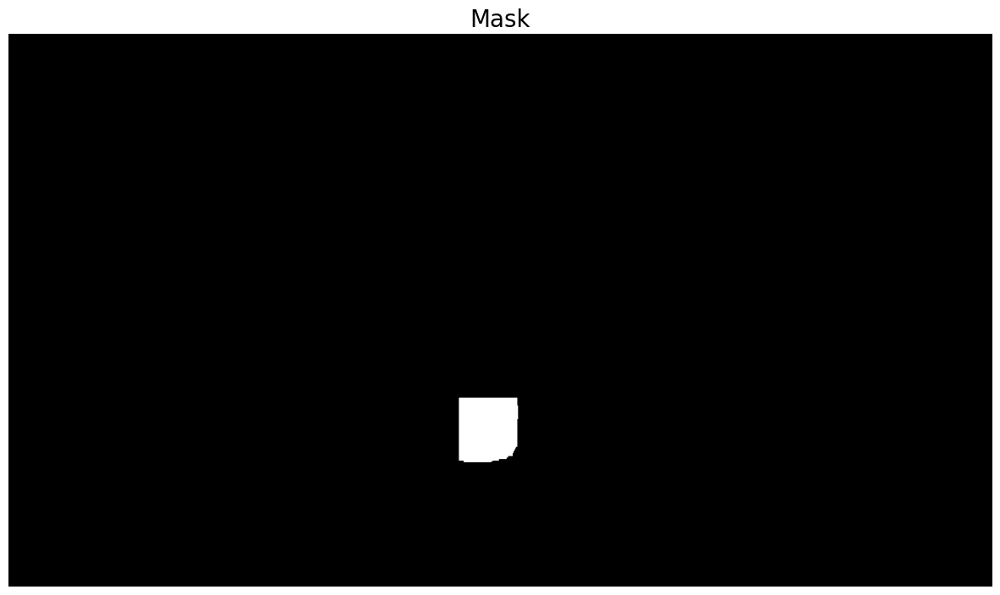

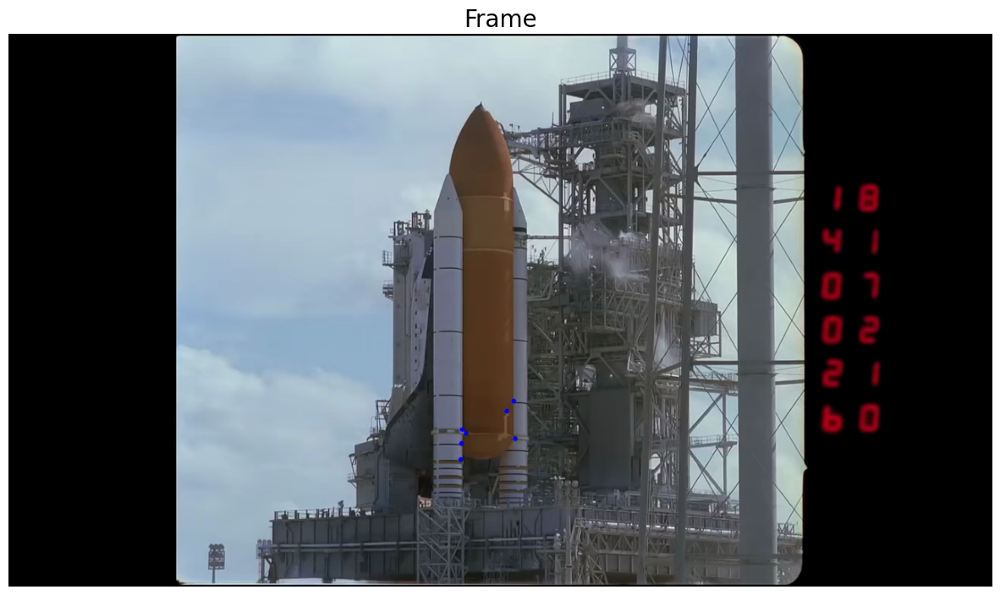

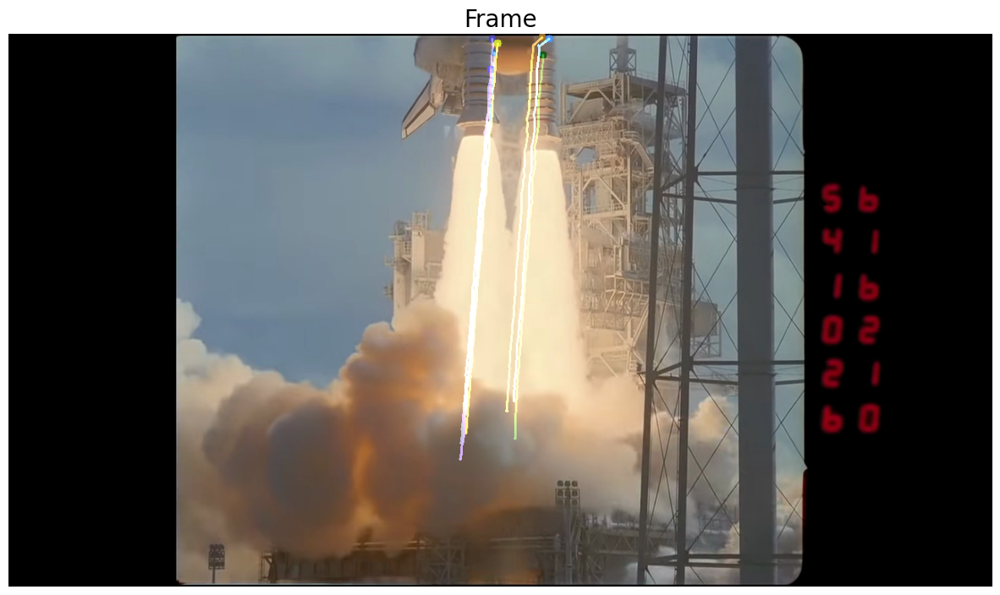

In [279]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj1 = baseLoop(shuttle, 100, 0.1, 5, True)

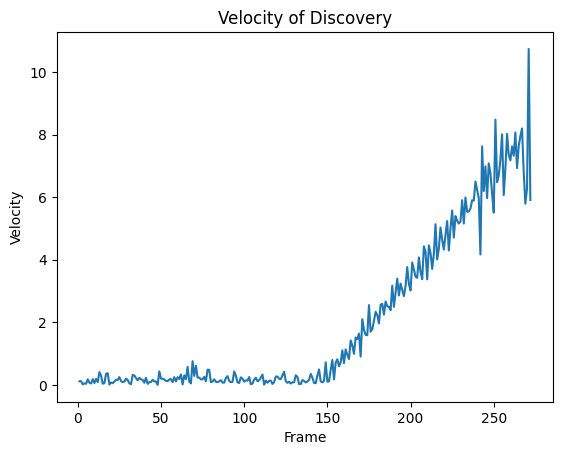

In [280]:
# plot velocities
plt.plot(list(velocities.keys()), list(velocities.values()))
plt.xlabel('Frame')
plt.ylabel('Velocity')
plt.title('Velocity of Discovery')
plt.show()

In [281]:
def baseLoop2(source: cv2.VideoCapture, max_points, quality, min_distance, m2=False, point_id=34):
    frame1 = None
    read_status, frame2 = source.read()
    color_frame = frame2.copy()
    frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    mask = make_mask(color_frame, m2)

    prev_points = cv2.goodFeaturesToTrack(frame2, max_points, quality, quality, mask=mask)

    for point in prev_points:
        x, y = point.ravel()
        x, y = int(x), int(y)
        cv2.circle(color_frame, (x, y), 3, (255, 0, 0), -1)

    blank = np.zeros_like(color_frame)
    blank_one = np.zeros_like(color_frame)

    color = np.random.randint(0, 255, (100, 3))
    onetraj = []  # trajectory of one point 
    frame_id = 1
    vel = {}

    while read_status:
        frame1 = frame2
        read_status, frame2 = source.read()

        if not read_status:
            break

        frame_color = frame2.copy()
        frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        nextPts, status, err = cv2.calcOpticalFlowPyrLK(frame1, frame2, prev_points, None)

        good_new = nextPts[status == 1]
        good_old = prev_points[status == 1]

        # oblicz predkosc
        velocity = np.mean(np.linalg.norm(good_new - good_old, axis=1))
        vel[frame_id] = velocity

        frame_color_one = frame_color.copy()

        if len(good_new) < len(prev_points):
            break
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            a, b, c, d = int(a), int(b), int(c), int(d)
            blank = cv2.line(blank, (a, b), (c, d), color[i].tolist(), 2)
            frame_color = cv2.circle(frame_color, (a, b), 5, color[i].tolist(), -1)
            if i == point_id:
                onetraj.append((a, b))
                blank_one = cv2.line(blank_one, (a, b), (c, d), color[i].tolist(), 2)
                frame_color_one = cv2.circle(frame_color_one, (a, b), 5, color[i].tolist(), -1)

        img = cv2.add(frame_color, blank)
        prev_points = good_new.reshape(-1, 1, 2)
        img2 = cv2.add(frame_color_one, blank_one)
        frame_id += 1

    # display_images([img], ['Frame'], figsize=(15, 15))
    display_images([img2], ['Frame'], figsize=(15, 15))

    return vel, onetraj

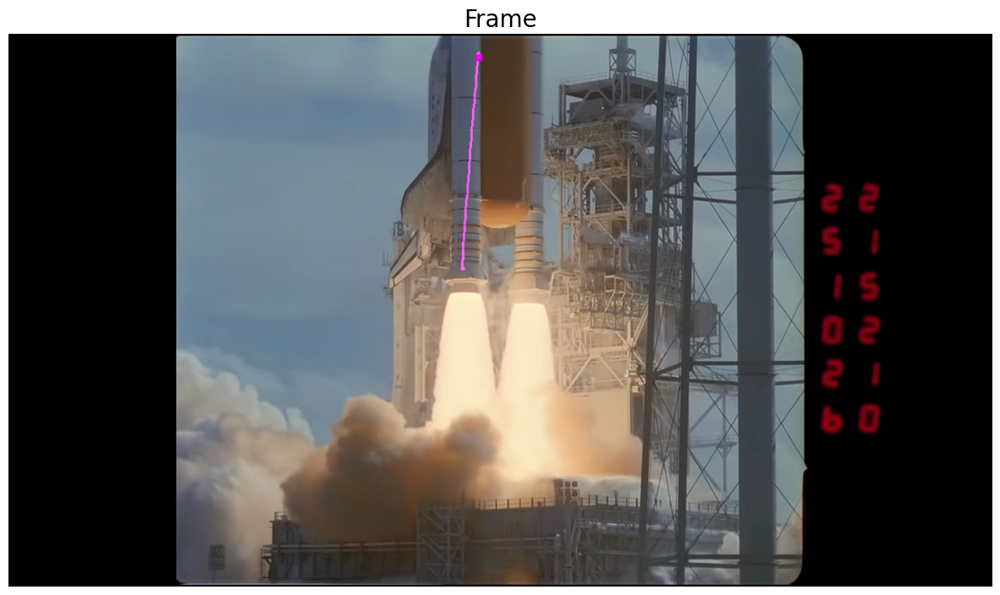

In [282]:
points_ids = [4, 1, 13, 9]

shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj1 = baseLoop2(shuttle, 100, 0.1, 5, False, 3)


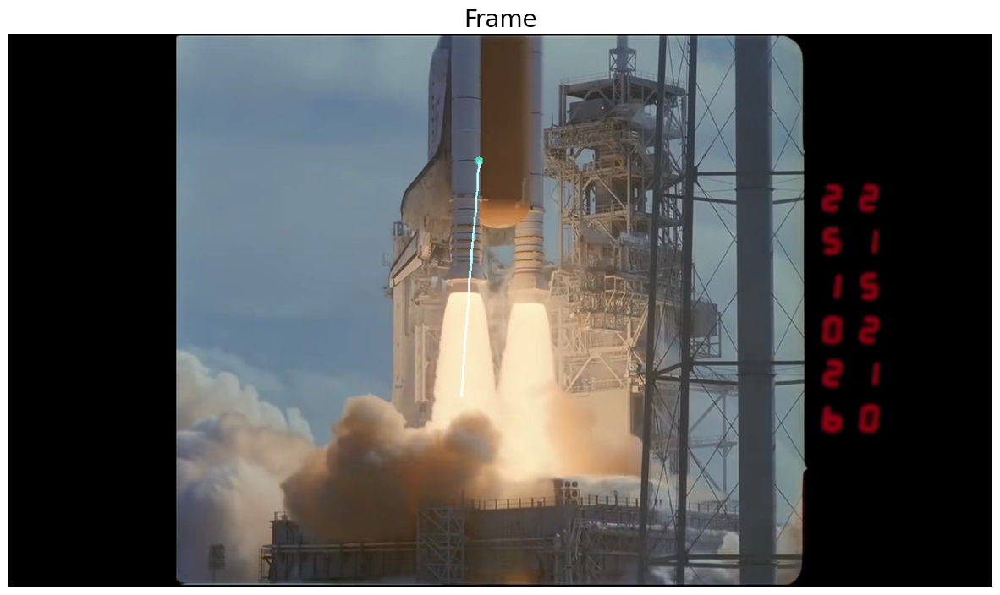

In [283]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj2 = baseLoop2(shuttle, 100, 0.1, 5, False,4)

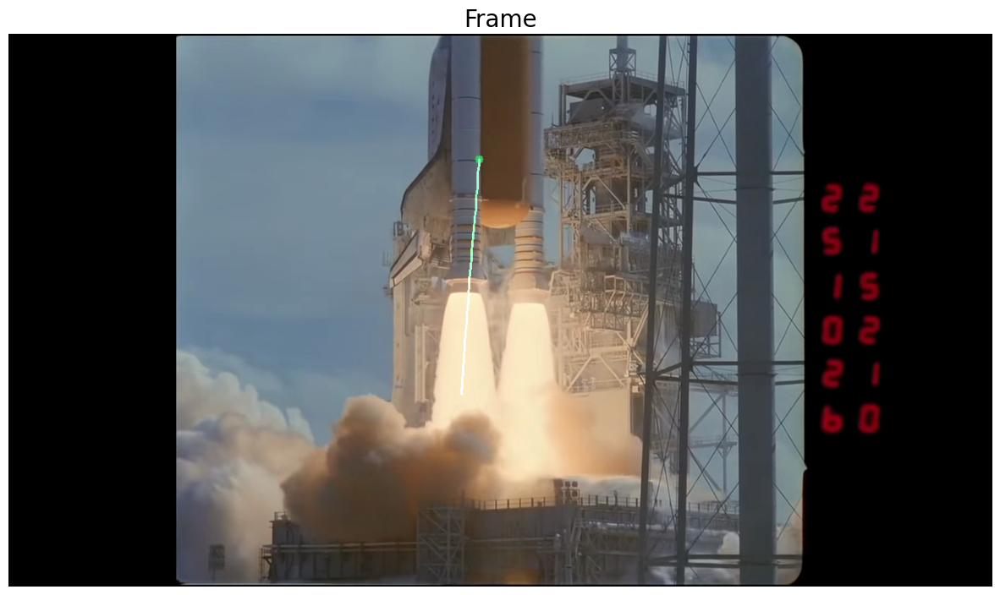

In [284]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj3 = baseLoop2(shuttle, 100, 0.1, 5, False, 7)

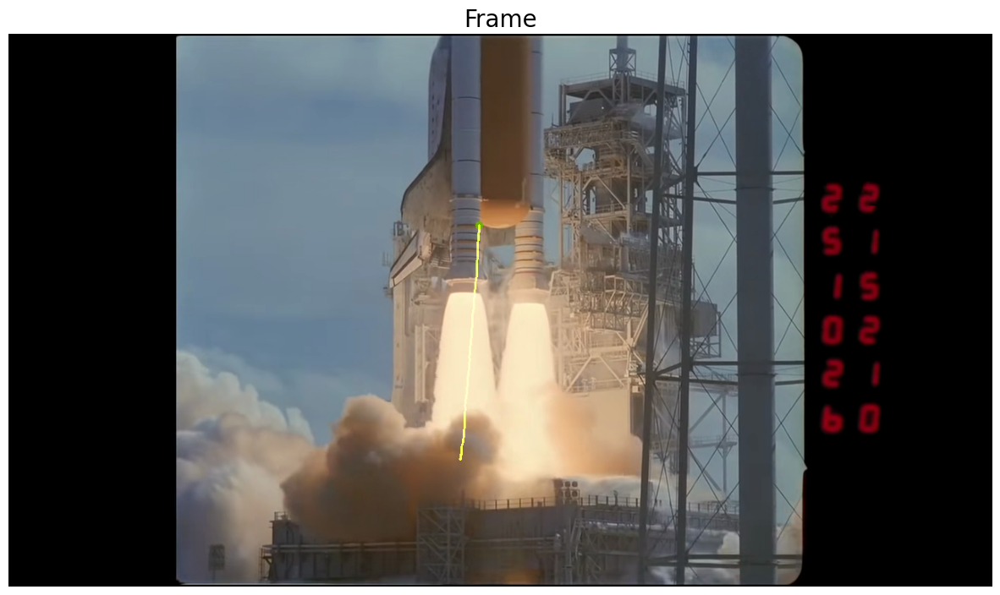

In [285]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj4 = baseLoop2(shuttle, 100, 0.1, 5, False, points_ids[3])

In [289]:
def baseLoopp(source: cv2.VideoCapture, max_points, quality, min_distance, m2=False, id=0):
    frame1 = None
    read_status, frame2 = source.read()
    color_frame = frame2.copy()
    frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    mask = make_mask(color_frame, m2)
    display_images([mask], ['Mask'], figsize=(15, 15))

    prev_points = cv2.goodFeaturesToTrack(frame2, max_points, quality, min_distance, mask=mask)

    for point in prev_points:
        x, y = point.ravel()
        x, y = int(x), int(y)
        cv2.circle(color_frame, (x, y), 3, (255, 0, 0), -1)
    display_images([color_frame], ['Frame'], figsize=(15, 15))

    blank = np.zeros_like(color_frame)
    blank_one = np.zeros_like(color_frame)

    color = np.random.randint(0, 255, (100, 3))
    onetraj = []  # trajectory of one point 
    point_id = id
    frame_id = 1
    vel = {}

    while read_status:
        frame1 = frame2
        read_status, frame2 = source.read()

        if not read_status:
            break

        frame_color = frame2.copy()
        frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        nextPts, status, err = cv2.calcOpticalFlowPyrLK(frame1, frame2, prev_points, None)

        good_new = nextPts[status == 1]
        good_old = prev_points[status == 1]

        # oblicz predkosc
        velocity = np.mean(np.linalg.norm(good_new - good_old, axis=1))
        vel[frame_id] = velocity

        frame_color_one = frame_color.copy()

        if len(good_new) < len(prev_points):
            break
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            a, b, c, d = int(a), int(b), int(c), int(d)
            blank = cv2.line(blank, (a, b), (c, d), color[i].tolist(), 2)
            frame_color = cv2.circle(frame_color, (a, b), 5, color[i].tolist(), -1)
            if i == point_id:
                onetraj.append((a, b))
                blank_one = cv2.line(blank_one, (a, b), (c, d), color[i].tolist(), 2)
                frame_color_one = cv2.circle(frame_color_one, (a, b), 5, color[i].tolist(), -1)

        img = cv2.add(frame_color, blank)
        prev_points = good_new.reshape(-1, 1, 2)
        img2 = cv2.add(frame_color_one, blank_one)
        frame_id += 1

    # display_images([img], ['Frame'], figsize=(15, 15))
    display_images([img2], ['Frame'], figsize=(15, 15))

    return vel, onetraj

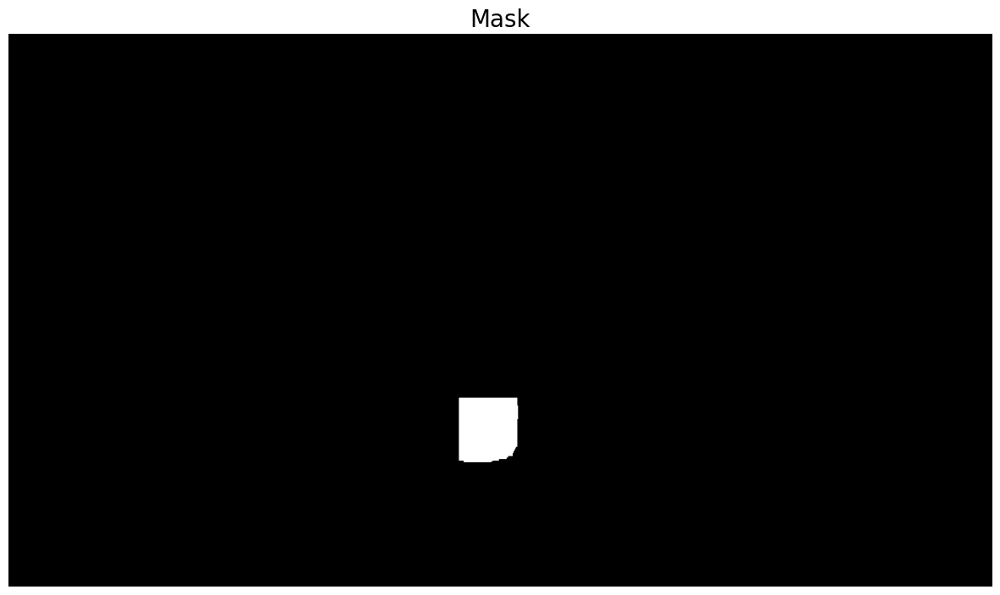

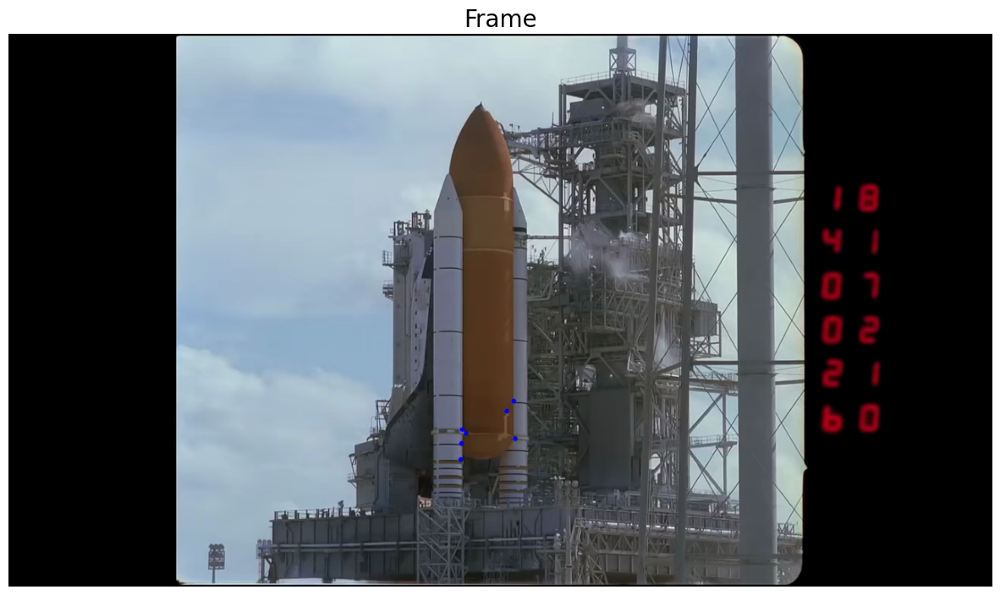

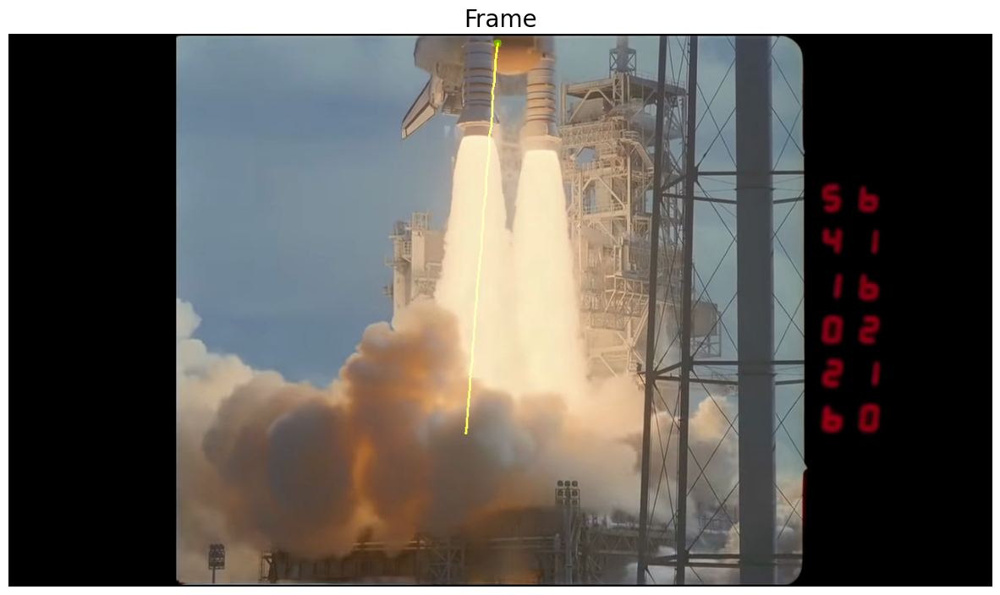

In [290]:
shuttle = cv2.VideoCapture('../Lab 8 - dane/shuttle.mp4')
velocities, traj5 = baseLoopp(shuttle, 100, 0.1, 5, True, id=4)

### Zadanie 3

Dokonaj analizy znalezionych trajektorii i znajdź prędkość _Discovery_. Wersja minimum: załóż, że pojazd porusza się z lokalnie stałą prędkością. Wersja normalna: wykreśl prędkość pojazdu jako funkcję czasu.

_Bonus dla chętnych: czy na podstawie tego materiału da się wyznaczyć TWR (thrust-to-weight ratio) maszyny?_

In [301]:
no_duplicat = list(set(traj5))
print('Trajectory:', len(traj5), 'Unique points:', len(no_duplicat))

Trajectory: 271 Unique points: 122


In [303]:
first = no_duplicat[0]
last = no_duplicat[-1]

distance = np.sqrt((last[0] - first[0]) ** 2 + (last[1] - first[1]) ** 2)
time = len(no_duplicat) / fps

speed = distance / time
print('Speed:', speed, 'm/s')

Speed: 26.11356311538176 m/s


In [291]:
def calculate_velocity(traj, fps):
    speeds = []
    j = 0
    while j + 30 < len(traj):
        x1, y1 = traj[j]
        x2, y2 = traj[j + 30]
        speed = (np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2) * 0.1)
        speeds.append(speed)
        j += 30
    return speeds

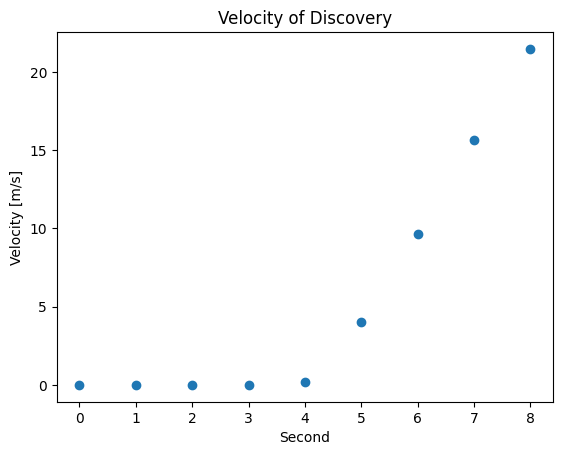

In [304]:
sped = calculate_velocity(traj5, fps)
plt.scatter([i for i in range(len(sped))], sped)
plt.xlabel('Second')
plt.ylabel('Velocity [m/s]')
plt.title('Velocity of Discovery')
plt.show()

WIKIPEDIA: wysokość zbiornika paliwa: 46,9 m, zbiornik ma ok 470 pikseli, więc 1 piksel odpowiada około 10 cm
masa całkowita: 2 041 000 kg
ubytek paliwa na sekundę: 11 000 kg